# Projet : AT&T Spam Detector

## Import Modules

In [1]:
import pandas as pd
import numpy as np
import re
import string

from pathlib import Path
import time

from datetime import datetime, timedelta

import plotly.express as px
import matplotlib.pyplot as plt

import seaborn as sns

from torchviz import make_dot

# ML
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.naive_bayes import MultinomialNB

from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    confusion_matrix, classification_report
)

# NLP
import tiktoken

from wordcloud import WordCloud

# Import Spacy
import en_core_web_sm
from spacy.lang.en.stop_words import STOP_WORDS as EN_STOP_WORDS

# Transformers
from transformers import pipeline, BertTokenizer, BertForSequenceClassification, BertModel
from torch.optim import AdamW
from transformers import get_linear_schedule_with_warmup

# PyTorch
import torch
import torch.nn as nn

from torch.nn.utils.rnn import pad_sequence

from torch.utils.data import Dataset, DataLoader

# Checking CUDA availability
print("CUDA: ", torch.cuda.is_available())


CUDA:  True


## Chargement du dataset

In [2]:
sms_df = pd.read_csv("./data/spam.csv", encoding="ISO-8859-1")

print("Head sampling:")
display(sms_df.head())

Head sampling:


,v1,v2,Unnamed: 2,Unnamed: 3,Unnamed: 4
0,ham,"Go until jurong point, crazy.. Available only ...",NaN,NaN,NaN
1,ham,Ok lar... Joking wif u oni...,NaN,NaN,NaN
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,NaN,NaN,NaN
3,ham,U dun say so early hor... U c already then say...,NaN,NaN,NaN
4,ham,"Nah I don't think he goes to usf, he lives aro...",NaN,NaN,NaN


## EDA basique

In [3]:
print("Shape: ", sms_df.shape)
print()
print("Nulls:")
print(sms_df.isnull().sum())
print()
print("Duplicates: ", sms_df.duplicated().sum())


Shape:  (5572, 5)

Nulls:
v1               0
v2               0
Unnamed: 2    5522
Unnamed: 3    5560
Unnamed: 4    5566
dtype: int64

Duplicates:  403


In [4]:
# Keeping only significant columns
sms_df = sms_df[['v1','v2']]
sms_df = sms_df.rename(columns={"v1": "class", "v2": "message"})

sms_df.drop_duplicates(inplace=True)

print("New shape: ", sms_df.shape)
print("New head sampling:")
display(sms_df.head())

New shape:  (5169, 2)
New head sampling:


,class,message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."


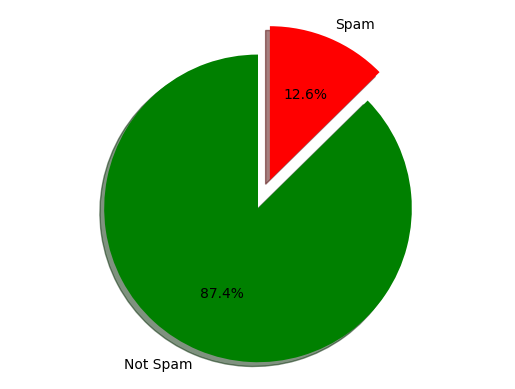

In [5]:
class_count = sms_df["class"].value_counts()

# Data to Plot
labels = "Not Spam", "Spam"
sizes = [class_count["ham"], class_count["spam"]]
colors = ["green", "red"]
explode = (0.1, 0.1)

# Plot
plt.pie(sizes, explode = explode, labels = labels, colors = colors, autopct = '%1.1f%%', shadow = True, startangle = 90)
plt.axis('equal')
plt.show()

In [6]:
# A quoi ressmblent les bon messages
display(sms_df[sms_df["class"] == "ham"].head()) 

,class,message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."
6,ham,Even my brother is not like to speak with me. ...


In [7]:
# A quoi ressemblent les spam
display(sms_df[sms_df["class"] == "ham"].head()) 

,class,message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."
6,ham,Even my brother is not like to speak with me. ...


In [8]:
# Message length distribution
sms_df['message_length'] = sms_df['message'].apply(len)

fig = px.histogram(sms_df, x="message_length", color="class",  color_discrete_sequence=["green", "red"], barmode="overlay")
fig.show()

A priori, les spam sont souvent plus long.

## Preprocessing

Préparer les messages pour leur utilisation par un modèle Deep Learning de classification.

- lowercase
- removing punctuation
- removing non ascii characters
- removing english STOP_WORDS
- lemmatization

In [9]:
nlp = en_core_web_sm.load()

# Special thanks to https://www.kaggle.com/tanulsingh077 for this function
def clean_text(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

def preprocess_text(text):
    # Clean puntuation, urls, and so on
    text = clean_text(text)

    # replace consecutive spaces by single space
    text = " ".join(text.split())

    # Stemming/Lemmatization
    text = " ".join([token.lemma_ for token in nlp(text) if (token.lemma_ not in EN_STOP_WORDS) & (token.text not in EN_STOP_WORDS)])
    
    return text

In [10]:
# Preprocess messages (cleanup, stemming, lemmatization)
sms_df["message_cleaned"] = sms_df["message"].apply(preprocess_text)
sms_df.head()

,class,message,message_length,message_cleaned
0,ham,"Go until jurong point, crazy.. Available only ...",111,jurong point crazy available bugis n great wor...
1,ham,Ok lar... Joking wif u oni...,29,ok lar joking wif u oni
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,155,free entry wkly comp win fa cup final tkts tex...
3,ham,U dun say so early hor... U c already then say...,49,u dun early hor u c
4,ham,"Nah I don't think he goes to usf, he lives aro...",61,nah think usf live


In [11]:
sms_df[(sms_df['message_cleaned'] == '') | (sms_df['message_cleaned'].isnull())]

,class,message,message_length,message_cleaned
43,ham,WHO ARE YOU SEEING?,19,
959,ham,Where @,7,
1087,ham,You can never do NOTHING,24,
1190,ham,We're done...,13,
1236,ham,How much are we getting?,24,
1407,ham,Then we gotta do it after that,30,
1449,ham,say thanks2.,13,
1611,ham,645,3,
2740,ham,Nothing. Can...,15,
2805,ham,Can a not?,10,


On fait un peu de ménage, les messages vide ne seront pas significatifs.

In [12]:
print("Old shape: ", sms_df.shape)
sms_df = sms_df[((sms_df['message_cleaned'] == '') | (sms_df['message_cleaned'].isnull())) == False]
print("New shape: ", sms_df.shape)

Old shape:  (5169, 4)
New shape:  (5147, 4)


In [13]:
# Encode classe (0: ham, 1: spam)
sms_df["class_encoded"] = sms_df["class"].apply(lambda x: 1 if x == 'spam' else 0)

### Visualisation des tokens

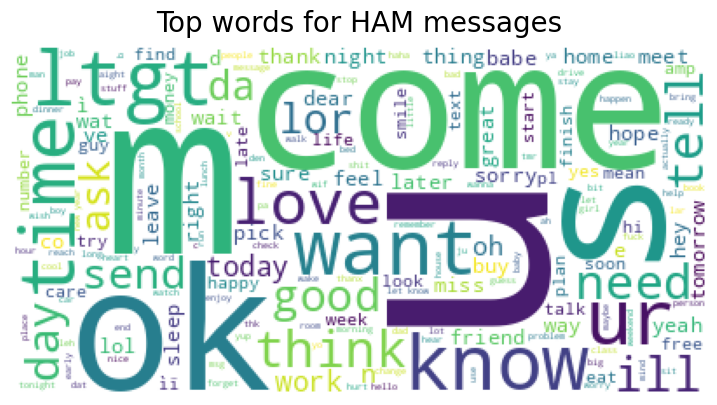

In [14]:
wc = WordCloud(
    background_color='white', 
    max_words=200,
)

wc.generate(' '.join(text for text in sms_df.loc[sms_df['class'] == 'ham', 'message_cleaned']))
plt.figure(figsize=(9,5))
plt.title('Top words for HAM messages', 
          fontdict={'size': 20,  'verticalalignment': 'bottom'})
plt.imshow(wc)
plt.axis("off")
plt.show()

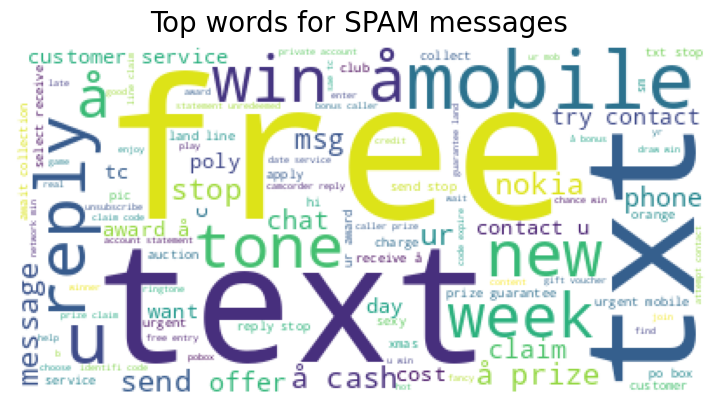

In [15]:
wc = WordCloud(
    background_color='white', 
    max_words=200, 

)
wc.generate(' '.join(text for text in sms_df.loc[sms_df['class'] == 'spam', 'message_cleaned']))
plt.figure(figsize=(9,5))
plt.title('Top words for SPAM messages', 
          fontdict={'size': 20,  'verticalalignment': 'bottom'})
plt.imshow(wc)
plt.axis("off")
plt.show()

## Vectorisation
- encoding
- padding

```
# Windows
uv pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu128

# Linux
uv pip install torch torchvision torchaudio


[[tool.uv.index]]
name = "pytorch-cu128"
url = "https://download.pytorch.org/whl/cu128"
explicit = true

[tool.uv.sources]
torch = [
  { index = "pytorch-cu128", marker = "sys_platform == 'linux' or sys_platform == 'win32'" },
]
torchvision = [
  { index = "pytorch-cu128", marker = "sys_platform == 'linux' or sys_platform == 'win32'" },
]
```


## Fonctions d'aide à l'évaluation et à la visualisation des performances

### Calcul et visualisation des métriques

In [16]:
def create_model_save_folder(base_path=Path("./assets/models")):
    # Ensure base_path is a Path object
    base_path = Path(base_path)

    # Create timestamped subdirectory
    timestamp = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    save_path = base_path / f"best_model_{timestamp}"

    # Create the directory
    save_path.mkdir(parents=True, exist_ok=True)

    return save_path


def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    # Round to the nearest second.
    elapsed_rounded = int(round((elapsed)))
    
    # Format as hh:mm:ss
    return str(timedelta(seconds=elapsed_rounded))

In [17]:
"""
- Accuracy → Taux global de bonnes prédictions
- Precision → Proportion de vrais spams parmi les messages prédits comme spams
- Recall → Proportion de spams détectés parmi tous les vrais spams
- F1-score → Moyenne harmonique entre precision et recall
- Classification Report → Détail par classe
- Confusion Matrix → Visualisation erreurs FP/FN
"""
def evaluate_model(y_true, y_pred, plot=False):
    # Scores
    acc = accuracy_score(y_true, y_pred)
    prec, rec, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="binary")

    if plot:
        print("✅ Évaluation du modèle :")
        print(f"Accuracy  : {acc:.2%}")
        print(f"Precision : {prec:.2%}")
        print(f"Recall    : {rec:.2%}")
        print(f"F1-score  : {f1:.2%}")
        print("\n📋 Classification Report :\n", classification_report(y_true, y_pred, target_names=["Ham", "Spam"]))

        # Confusion Matrix
        cm = confusion_matrix(y_true, y_pred)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=["Ham", "Spam"], yticklabels=["Ham", "Spam"])
        plt.xlabel("Prédictions")
        plt.ylabel("Vérités")
        plt.title("Matrice de confusion")
        plt.show()

    return acc, prec, rec, f1


### Evaluation d'un modèle PyTorch

In [18]:
def evaluate_pytorch_model(model, dataloader, criterion=None, device='cpu', plot=False):
    model.eval()
    y_true = []
    y_pred = []
    
    total_loss = 0
    
    total_t0 = time.time()

    with torch.no_grad():
        for X_batch, y_batch in dataloader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs = model(X_batch)

            # compute loss
            if criterion:
                loss = criterion(outputs, y_batch)
                total_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)

            y_true.extend(y_batch.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())
    
    total_samples = len(dataloader.dataset)
    
    avg_loss = total_loss / total_samples
    
    d_total_t = time.time()-total_t0
    if plot:
        print("🕒 Inference of {} messages took {:} (h:mm:ss) [avg: {:.4f}s/msg]".format(total_samples, format_time(d_total_t), d_total_t / total_samples))

    # plot reports if requested
    acc, prec, rec, f1 = evaluate_model(y_true, y_pred, plot)
    return avg_loss, acc, prec, rec, f1

# Modèle basé sur BinaryCrossEntropyLoss
def evaluate_pytorch_binary_model(model, dataloader, criterion=None, device='cpu', plot=False):
    model.eval()
    y_true = []
    y_pred = []
    total_loss = 0

    total_t0 = time.time()

    with torch.no_grad():
        for X_batch, y_batch in dataloader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs = model(X_batch)

            # compute loss
            if criterion:
                loss = criterion(outputs, y_batch.float())
                total_loss += loss.item()

            probs = torch.sigmoid(outputs)
            preds = (probs > 0.5).long()

            y_true.extend(y_batch.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    total_samples = len(dataloader.dataset)
    
    avg_loss = total_loss / total_samples
    
    d_total_t = time.time()-total_t0
    if plot:
        print("🕒 Inference of {} messages took {:} (h:mm:ss) [avg: {:.4f}s/msg]".format(total_samples, format_time(d_total_t), d_total_t / total_samples))
    
    # plot reports if requested
    acc, prec, rec, f1 = evaluate_model(y_true, y_pred, plot)

    return avg_loss, acc, prec, rec, f1


### History plot

In [19]:
def plot_train_history(history):
    # Visualisation de l'entrainement
    epochs = range(1, len(history["train_loss"]) + 1)

    fig = plt.figure(figsize=(10, 4))
    
    # Subplot 1 - Loss
    ax1 = plt.subplot(1, 3, 1)
    ax1.plot(epochs, history["train_loss"], color="b")
    ax1.plot(epochs, history["val_loss"], color="r")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Loss")
    ax1.set_title("Losses")
    ax1.grid(True)

    # Subplot 2 - Accuracy
    ax2 = plt.subplot(1, 3, 2)
    ax2.plot(epochs, history["train_accuracy"], color="b")
    ax2.plot(epochs, history["val_accuracy"], color="r")
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("Accuracy")
    ax2.set_title("Accuracies")
    ax2.grid(True)

    # Subplot 3 - F1
    ax3 = plt.subplot(1, 3, 3)
    if len(history["train_f1"]) > 0:
        ax3.plot(epochs, history["train_f1"], color="b")
    ax3.plot(epochs, history["val_f1"], color="r")
    ax3.set_xlabel("Epoch")
    ax3.set_ylabel("F1-score")
    ax3.set_title("F1-scores")
    ax3.grid(True)

    # Add a single legend to the whole figure
    fig.legend(["Train", "Validation"], loc="upper center", ncol=2, fontsize="medium")

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for legend at top
    
    plt.show()

In [20]:
def print_torch_info(model):
    nb_params = 0
    nb_trainable_params = 0
    params = list(model.named_parameters())

    for p in params:
        p_size = np.prod(p[1].size())
        
        nb_params = nb_params + p_size
        
        if p[1].requires_grad:
            nb_trainable_params = nb_trainable_params + p_size

    print(f"Parameters:  {nb_params} (Trainable: {nb_trainable_params})")

## Découpage du dataset

Afin d'évaluer les modèles sur les mêmes bases, le dataset est préalablement séparé en deux buckets : train et validation.

Les modèles seront entrainés avec le dataset `train` et les performances mesurées avec dataset de `validation`.

In [21]:
X_df = sms_df[["message", "message_cleaned"]]
y_df = sms_df["class_encoded"]

X_train_df, X_val_df, y_train_df, y_val_df = train_test_split(X_df, y_df, test_size=0.2, random_state=42, stratify=y_df)

print(f"Train dataset      : {len(X_train_df)}\n{y_train_df.value_counts(normalize=True)}", )
print()
print(f"Validation dataset : {len(X_val_df)}\n{y_val_df.value_counts(normalize=True)}", )

Train dataset      : 4117
class_encoded
0    0.873209
1    0.126791
Name: proportion, dtype: float64

Validation dataset : 1030
class_encoded
0    0.873786
1    0.126214
Name: proportion, dtype: float64


In [22]:
def build_dataset_lists(message_col):
    X_train = X_train_df[message_col].tolist()
    X_val = X_val_df[message_col].tolist()
    y_train = y_train_df.tolist()
    y_val = y_val_df.tolist()
    
    return X_train, X_val, y_train, y_val

## Machine Learning: Multinomial Naive Bayes model

📌 Train metrics:

🕒 Inference of 4117 messages took 0:00:00 (h:mm:ss) [avg: 0.0000s/msg]
✅ Évaluation du modèle :
Accuracy  : 98.81%
Precision : 95.57%
Recall    : 95.02%
F1-score  : 95.29%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       0.99      0.99      0.99      3595
        Spam       0.96      0.95      0.95       522

    accuracy                           0.99      4117
   macro avg       0.97      0.97      0.97      4117
weighted avg       0.99      0.99      0.99      4117



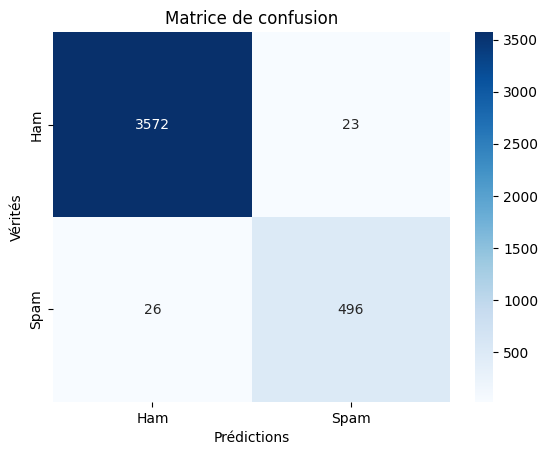

📌 Validation metrics:

🕒 Inference of 1030 messages took 0:00:00 (h:mm:ss) [avg: 0.0000s/msg]
✅ Évaluation du modèle :
Accuracy  : 97.28%
Precision : 89.84%
Recall    : 88.46%
F1-score  : 89.15%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       0.98      0.99      0.98       900
        Spam       0.90      0.88      0.89       130

    accuracy                           0.97      1030
   macro avg       0.94      0.94      0.94      1030
weighted avg       0.97      0.97      0.97      1030



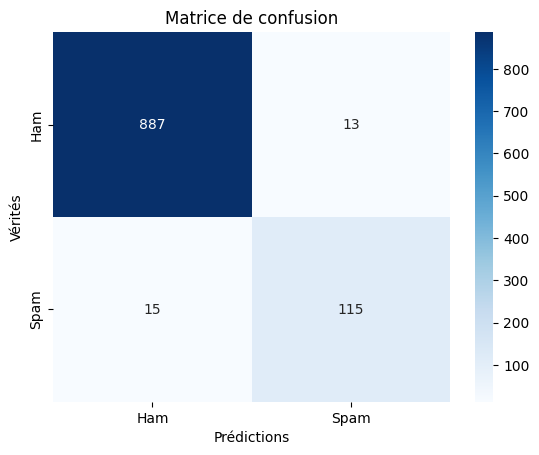

(0.9728155339805825, 0.8984375, 0.8846153846153846, 0.8914728682170543)

In [23]:
# The data
X_train_mnb, X_val_mnb, y_train_mnb, y_val_mnb = build_dataset_lists("message_cleaned")

# Vectorizing
count_vector = CountVectorizer()

X_train_mnb_vec = count_vector.fit_transform(X_train_mnb)
X_val_mnb_vec = count_vector.transform(X_val_mnb)

# Model
mnb_model = MultinomialNB()

# Training
mnb_model.fit(X_train_mnb_vec, y_train_mnb)

# alt:
# mnb_model_pipeline = make_pipeline(CountVectorizer(), MultinomialNB())
# mnb_model_pipeline.fit(X_train, y_train)

# Predicting
train_t0 = time.time()
y_train_pred_mnb = mnb_model.predict(X_train_mnb_vec)
d_train_t = time.time() - train_t0

val_t0 = time.time()
y_val_pred_mnb = mnb_model.predict(X_val_mnb_vec)
d_val_t = time.time() - val_t0

# Evaluate
print(f"{'='*40}\n📌 Train metrics:\n")
print("🕒 Inference of {} messages took {:} (h:mm:ss) [avg: {:.4f}s/msg]".format(len(X_train_mnb), format_time(d_train_t), d_train_t / len(X_train_mnb)))

evaluate_model(y_train_mnb, y_train_pred_mnb, plot=True)

print(f"{'='*40}\n📌 Validation metrics:\n")
print("🕒 Inference of {} messages took {:} (h:mm:ss) [avg: {:.4f}s/msg]".format(len(X_val_mnb), format_time(d_val_t), d_val_t / len(X_val_mnb)))

evaluate_model(y_val_mnb, y_val_pred_mnb, plot=True)

## TF-IDF + Dense layer

Création d'un modèle simple (baseline) afin de pouvoir mesurer les améliorations apportées (ou non) lors de la mise en oeuvre de modèles plus élaborés.

### Préparation des données

In [24]:
# The data (le .tolist() évite des problèmes lors du passage en tensor - issues with pandas df on missing indexes - sinon il faudrait .reset_index(drop=True))

# The data
X_train_tfidf, X_val_tfidf, y_train_tfidf, y_val_tfidf = build_dataset_lists("message_cleaned")

# TF-IDF vectorisation
vectorizer = TfidfVectorizer(max_features=5000)

X_train_tfidf_vec = vectorizer.fit_transform(X_train_tfidf).toarray()
X_val_tfidf_vec = vectorizer.transform(X_val_tfidf).toarray()


### Dataset PyTorch

In [25]:
class TfidfDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

train_dataset_tfidf = TfidfDataset(X_train_tfidf_vec, y_train_tfidf)
val_dataset_tfidf = TfidfDataset(X_val_tfidf_vec, y_val_tfidf)

train_loader_tfidf = DataLoader(train_dataset_tfidf, batch_size=32, shuffle=True)
val_loader_tfidf = DataLoader(val_dataset_tfidf, batch_size=32)


### Modèles

#### Modèle Dense (CrossEntropyLoss)

In [26]:
class SpamClassifier(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 2)  # 2 classes : spam / not spam
        )

    def forward(self, x):
        return self.model(x)

In [27]:
dummy_model = SpamClassifier(10)

dummy_input = torch.randn(1,10)
dummy_output = dummy_model(dummy_input)

# Create and display the computational graph
make_dot(dummy_output, params=dict(dummy_model.named_parameters()), show_attrs=True).render("./assets/spam_classifier_architecture", format="png")

'assets/spam_classifier_architecture.png'

![spam_classifier_architecturet](./assets/spam_classifier_architecture.png)

##### Entraînement

In [28]:
# This function is used to train a PyTorch model with training and validation datasets
def train(model, train_loader, val_loader, criterion, optimizer, epochs=100, device='cpu'):
    history = {
        "train_loss": [],
        "val_loss": [],
        "train_accuracy": [],
        "val_accuracy": [],
        "train_f1": [],
        "val_f1": [],
    }
    
    for epoch in range(epochs):
        model.train()
        total_loss = 0
        total_correct = 0
        total_samples = 0
        
        # Training loop
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)

            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            
            # Compter les prédictions correctes
            preds = torch.argmax(outputs, dim=1)
            correct = (preds == y_batch).sum().item()

            total_correct += correct
            total_samples += y_batch.size(0)

        # Compute average loss and accuracy for training
        train_loss = total_loss / total_samples
        train_acc = total_correct / total_samples

        val_loss, val_acc, _, _, val_f1 = evaluate_pytorch_model(model, val_loader, criterion=criterion, device=device, plot=False)

        # Store metrics in history dictionary
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_accuracy"].append(train_acc)
        history["val_accuracy"].append(val_acc)
        history["val_f1"].append(val_f1)
        
        # Print training progress
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.4f}, Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}, {total_samples} samples")

    return history  # Return training history

In [29]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

cels_model = SpamClassifier(input_dim=5000).to(device)
cels_criterion = nn.CrossEntropyLoss().to(device)
cels_optimizer = torch.optim.Adam(cels_model.parameters(), lr=1e-3)

# Train the model on 20 epochs
cels_history = train(cels_model,
                train_loader=train_loader_tfidf,
                val_loader=val_loader_tfidf,
                criterion=cels_criterion,
                optimizer=cels_optimizer,
                epochs=5,
                device=device)

Epoch [1/5], Loss: 0.0128, Acc: 0.8317, Val Loss: 0.0054, Val Acc: 0.9447, 4117 samples
Epoch [2/5], Loss: 0.0034, Acc: 0.9687, Val Loss: 0.0026, Val Acc: 0.9709, 4117 samples
Epoch [3/5], Loss: 0.0016, Acc: 0.9837, Val Loss: 0.0021, Val Acc: 0.9728, 4117 samples
Epoch [4/5], Loss: 0.0010, Acc: 0.9913, Val Loss: 0.0020, Val Acc: 0.9709, 4117 samples
Epoch [5/5], Loss: 0.0006, Acc: 0.9954, Val Loss: 0.0020, Val Acc: 0.9718, 4117 samples


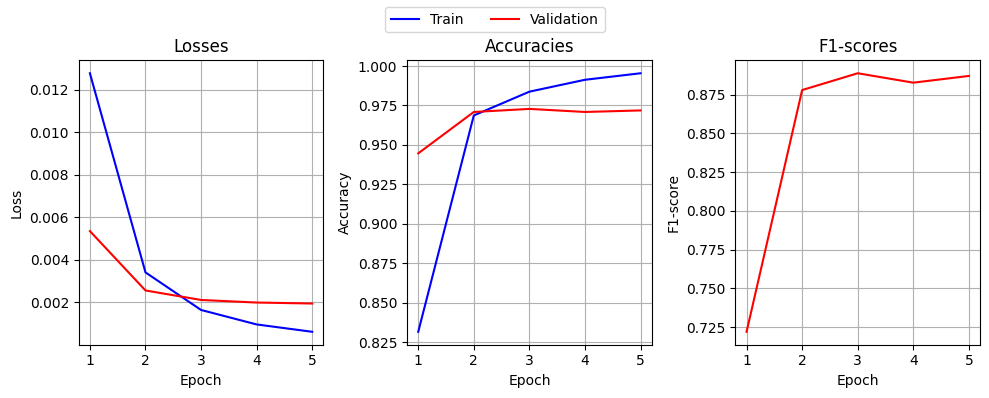

In [30]:
plot_train_history(cels_history)

##### Performances

📌 Train metrics:

🕒 Inference of 4117 messages took 0:00:00 (h:mm:ss) [avg: 0.0000s/msg]
✅ Évaluation du modèle :
Accuracy  : 99.73%
Precision : 99.23%
Recall    : 98.66%
F1-score  : 98.94%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       1.00      1.00      1.00      3595
        Spam       0.99      0.99      0.99       522

    accuracy                           1.00      4117
   macro avg       1.00      0.99      0.99      4117
weighted avg       1.00      1.00      1.00      4117



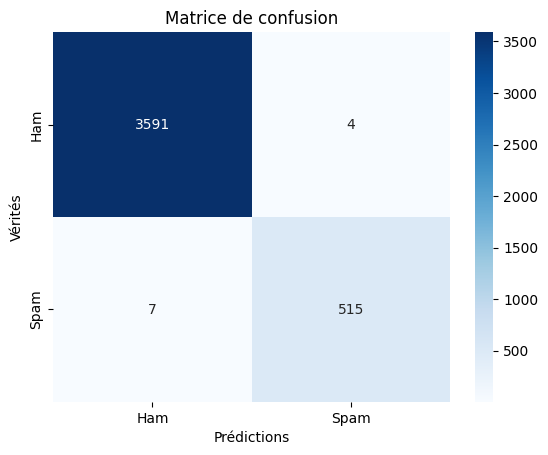

📌 Validation metrics:

🕒 Inference of 1030 messages took 0:00:00 (h:mm:ss) [avg: 0.0000s/msg]
✅ Évaluation du modèle :
Accuracy  : 97.18%
Precision : 89.76%
Recall    : 87.69%
F1-score  : 88.72%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       0.98      0.99      0.98       900
        Spam       0.90      0.88      0.89       130

    accuracy                           0.97      1030
   macro avg       0.94      0.93      0.94      1030
weighted avg       0.97      0.97      0.97      1030



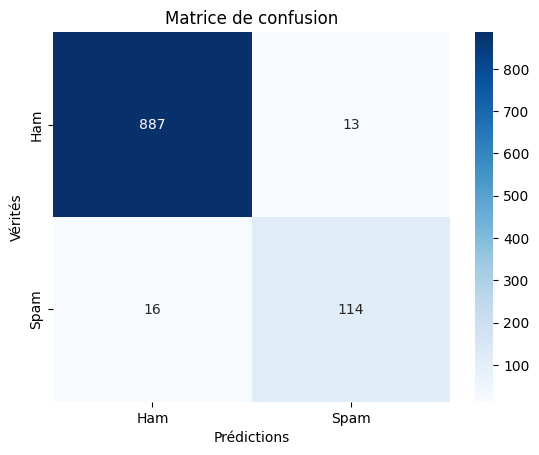

(0.0019501109480930185,
 0.9718446601941747,
 0.8976377952755905,
 0.8769230769230769,
 0.8871595330739299)

In [31]:
# Evaluate
print(f"{'='*40}\n📌 Train metrics:\n")
evaluate_pytorch_model(cels_model, train_loader_tfidf, criterion=cels_criterion, device=device, plot=True)

print(f"{'='*40}\n📌 Validation metrics:\n")
evaluate_pytorch_model(cels_model, val_loader_tfidf, criterion=cels_criterion, device=device, plot=True)


#### BinaryCrossEntropyLoss

In [32]:
class SpamBinaryClassifier(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 1)  # 🔸 1 seule sortie = score spam
        )

    def forward(self, x):
        return self.model(x).squeeze(1)  # [batch_size] au lieu de [batch_size, 1]

In [33]:
dummy_model = SpamBinaryClassifier(10)

dummy_input = torch.randn(1,10)
dummy_output = dummy_model(dummy_input)

# Create and display the computational graph
make_dot(dummy_output, params=dict(dummy_model.named_parameters()), show_attrs=True).render("./assets/spam_binary_classifier_architecture", format="png")

'assets/spam_binary_classifier_architecture.png'

![spam_binary_classifier_architecture](./assets/spam_binary_classifier_architecture.png)

In [34]:
# This function is used to train a PyTorch model with training and validation datasets
def train_binary_model(model, train_loader, val_loader, criterion, optimizer, epochs=100, device='cpu'):
    history = {
        "train_loss": [],
        "val_loss": [],
        "train_accuracy": [],
        "val_accuracy": [],
        "train_f1": [],
        "val_f1": [],
    }
    
    for epoch in range(epochs):
        model.train()
        total_loss = 0
        total_correct = 0
        total_samples = 0
        
        # Training loop
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)

            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

            # Compter les prédictions correctes
            probs = torch.sigmoid(outputs)
            #preds = (probs > 0.5).float()
            preds = (probs >= 0.5).long()
            
            # preds = torch.argmax(outputs, dim=1)
            correct = (preds == y_batch).sum().item()

            total_correct += correct
            total_samples += y_batch.size(0)

        # Compute average loss and accuracy for training
        train_loss = total_loss / total_samples
        train_acc = total_correct / total_samples

        val_loss, val_acc, _, _, val_f1 = evaluate_pytorch_binary_model(model, val_loader, criterion=criterion, device=device, plot=False)

        # Store metrics in history dictionary
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_accuracy"].append(train_acc)
        history["val_accuracy"].append(val_acc)
        history["val_f1"].append(val_f1)
        
        # Print training progress
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.4f}, Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}, {total_samples} samples")

    return history  # Return training history

In [35]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

bcels_model = SpamBinaryClassifier(input_dim=5000).to(device)

bcels_criterion = nn.BCEWithLogitsLoss().to(device)
bcels_optimizer = torch.optim.Adam(bcels_model.parameters(), lr=1e-3)

# Train the model on 20 epochs
bcels_history = train_binary_model(bcels_model,
                train_loader=train_loader_tfidf,
                val_loader=val_loader_tfidf,
                criterion=bcels_criterion,
                optimizer=bcels_optimizer,
                epochs=5,
                device=device)

Epoch [1/5], Loss: 0.0144, Acc: 0.8773, Val Loss: 0.0072, Val Acc: 0.9155, 4117 samples


Epoch [2/5], Loss: 0.0047, Acc: 0.9543, Val Loss: 0.0032, Val Acc: 0.9689, 4117 samples
Epoch [3/5], Loss: 0.0023, Acc: 0.9794, Val Loss: 0.0024, Val Acc: 0.9718, 4117 samples
Epoch [4/5], Loss: 0.0014, Acc: 0.9866, Val Loss: 0.0021, Val Acc: 0.9728, 4117 samples
Epoch [5/5], Loss: 0.0010, Acc: 0.9910, Val Loss: 0.0020, Val Acc: 0.9709, 4117 samples


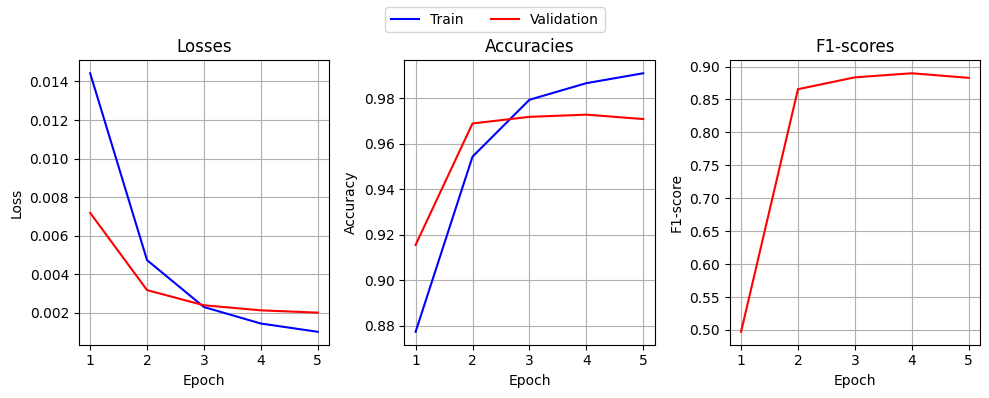

In [36]:
plot_train_history(bcels_history)

📌 Train metrics:

🕒 Inference of 4117 messages took 0:00:00 (h:mm:ss) [avg: 0.0001s/msg]
✅ Évaluation du modèle :
Accuracy  : 99.61%
Precision : 99.41%
Recall    : 97.51%
F1-score  : 98.45%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       1.00      1.00      1.00      3595
        Spam       0.99      0.98      0.98       522

    accuracy                           1.00      4117
   macro avg       1.00      0.99      0.99      4117
weighted avg       1.00      1.00      1.00      4117



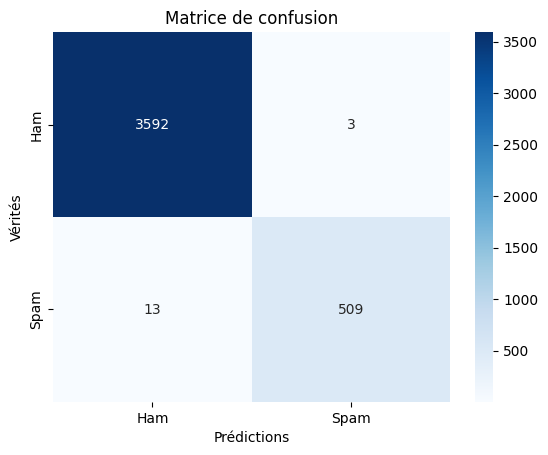

📌 Validation metrics:

🕒 Inference of 1030 messages took 0:00:00 (h:mm:ss) [avg: 0.0001s/msg]
✅ Évaluation du modèle :
Accuracy  : 97.09%
Precision : 89.68%
Recall    : 86.92%
F1-score  : 88.28%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       0.98      0.99      0.98       900
        Spam       0.90      0.87      0.88       130

    accuracy                           0.97      1030
   macro avg       0.94      0.93      0.93      1030
weighted avg       0.97      0.97      0.97      1030



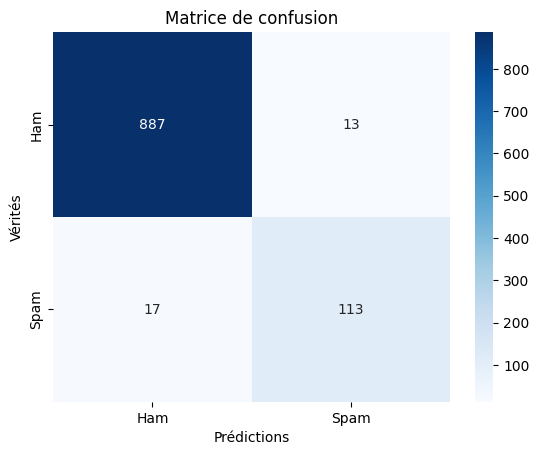

(0.0020095279535224425,
 0.970873786407767,
 0.8968253968253969,
 0.8692307692307693,
 0.8828125)

In [37]:
# Evaluate
print(f"{'='*40}\n📌 Train metrics:\n")
evaluate_pytorch_binary_model(bcels_model, train_loader_tfidf, criterion=bcels_criterion, device=device, plot=True)

print(f"{'='*40}\n📌 Validation metrics:\n")
evaluate_pytorch_binary_model(bcels_model, val_loader_tfidf, criterion=bcels_criterion, device=device, plot=True)

## Embeddings

Use an Embedding layer in combination with `tiktoken` tokenizer.

In [38]:
class SpamTokenizedDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        # Basic prepropcessing, no more required with tiktoken
        self.sequences = [torch.tensor(tokenizer.encode(text.strip().lower())[:max_len]) for text in texts]
        self.labels = torch.tensor(labels, dtype=torch.float32)

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx], self.labels[idx]

def collate_fn(batch, pad_idx=0):
    texts, labels = zip(*batch)
    padded = pad_sequence(texts, batch_first=True, padding_value=pad_idx)
    return padded, torch.tensor(labels, dtype=torch.float32)

In [39]:
class SpamClassifierWithEmbedding(nn.Module):
    def __init__(self, vocab_size, embed_dim=128):
        super().__init__()
        
        # Embedding layer: Maps word indices to dense vector representations
        # padding_idx=0 ensures that padding tokens (index 0) do not contribute to learning
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=0)

        # Adaptive Average Pooling: Computes the average of the word embeddings along the sequence length
        # This helps reduce variable-length text into a fixed-size representation
        self.pooling = nn.AdaptiveAvgPool1d(1)

        # Fully Connected (Linear) layer: Maps the fixed-size vector to a single output value
        self.fc = nn.Sequential(
            nn.Linear(embed_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 1)
        )

    def forward(self, x): # x: [batch_size, seq_len]
        # Convert input word indices into dense embeddings
        embedded = self.embedding(x)         # [batch_size, seq_len, embed_dim]

        # Permute to match the expected shape for pooling: (batch, channels, sequence_length)
        # Then, apply average pooling to reduce sequence length to 1
        pooled = self.pooling(embedded.permute(0, 2, 1)).squeeze(2)
        
        return self.fc(pooled).squeeze(1)    # [batch_size]


In [40]:
dummy_model = SpamClassifierWithEmbedding(100277)
dummy_input = torch.randint(0, 100277, (1, 128))
dummy_output = dummy_model(dummy_input)

# Create and display the computational graph
make_dot(dummy_output, params=dict(dummy_model.named_parameters()), show_attrs=True).render("./assets/spam_embedding_classifier_architecture", format="png")

'assets/spam_embedding_classifier_architecture.png'

In [41]:
# Tokenizer
tik_tokenizer = tiktoken.get_encoding("cl100k_base")

print("Vocabulary size: ", tik_tokenizer.n_vocab)

# The data (raw message as tokenizer handle everything)
X_train_tok, X_val_tok, y_train_tok, y_val_tok = build_dataset_lists("message")

X_train_tok = SpamTokenizedDataset(X_train_tok, y_train_tok, tik_tokenizer)
X_val_tok = SpamTokenizedDataset(X_val_tok, y_val_tok, tik_tokenizer)

X_train_tok_loader = DataLoader(X_train_tok, batch_size=32, shuffle=True, collate_fn=collate_fn)
X_val_tok_loader = DataLoader(X_val_tok, batch_size=32, collate_fn=collate_fn)

Vocabulary size:  100277


In [42]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

embedding_model = SpamClassifierWithEmbedding(vocab_size=tik_tokenizer.n_vocab).to(device)
embedding_criterion = nn.BCEWithLogitsLoss()
embedding_optimizer = torch.optim.Adam(embedding_model.parameters(), lr=1e-3)

# Train the model on 20 epochs
embedding_history = train_binary_model(embedding_model,
                train_loader=X_train_tok_loader,
                val_loader=X_val_tok_loader,
                criterion=embedding_criterion,
                optimizer=embedding_optimizer,
                epochs=10,
                device=device)

Epoch [1/10], Loss: 0.0136, Acc: 0.9036, Val Loss: 0.0060, Val Acc: 0.9650, 4117 samples
Epoch [2/10], Loss: 0.0040, Acc: 0.9711, Val Loss: 0.0028, Val Acc: 0.9786, 4117 samples
Epoch [3/10], Loss: 0.0021, Acc: 0.9828, Val Loss: 0.0021, Val Acc: 0.9854, 4117 samples
Epoch [4/10], Loss: 0.0014, Acc: 0.9866, Val Loss: 0.0017, Val Acc: 0.9864, 4117 samples
Epoch [5/10], Loss: 0.0009, Acc: 0.9932, Val Loss: 0.0015, Val Acc: 0.9883, 4117 samples
Epoch [6/10], Loss: 0.0006, Acc: 0.9947, Val Loss: 0.0014, Val Acc: 0.9893, 4117 samples
Epoch [7/10], Loss: 0.0004, Acc: 0.9959, Val Loss: 0.0014, Val Acc: 0.9883, 4117 samples
Epoch [8/10], Loss: 0.0003, Acc: 0.9983, Val Loss: 0.0013, Val Acc: 0.9893, 4117 samples
Epoch [9/10], Loss: 0.0002, Acc: 0.9985, Val Loss: 0.0013, Val Acc: 0.9893, 4117 samples
Epoch [10/10], Loss: 0.0002, Acc: 0.9990, Val Loss: 0.0013, Val Acc: 0.9913, 4117 samples


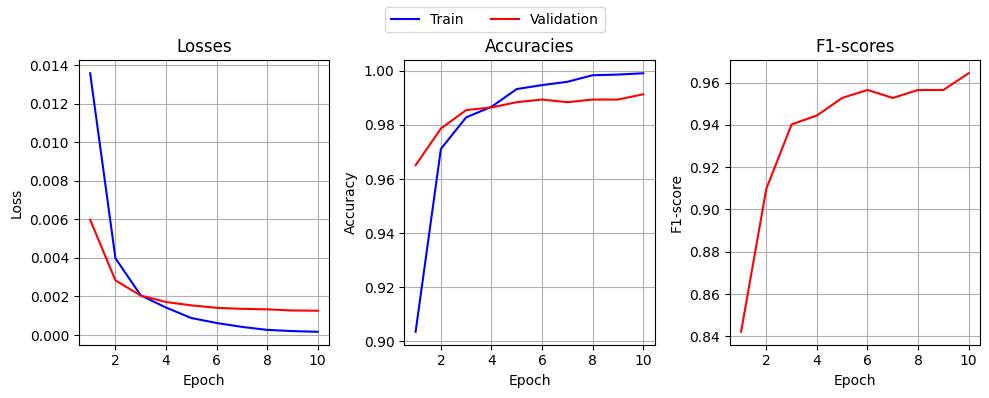

In [43]:
plot_train_history(embedding_history)

📌 Train metrics:

🕒 Inference of 4117 messages took 0:00:00 (h:mm:ss) [avg: 0.0001s/msg]
✅ Évaluation du modèle :
Accuracy  : 99.95%
Precision : 100.00%
Recall    : 99.62%
F1-score  : 99.81%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       1.00      1.00      1.00      3595
        Spam       1.00      1.00      1.00       522

    accuracy                           1.00      4117
   macro avg       1.00      1.00      1.00      4117
weighted avg       1.00      1.00      1.00      4117



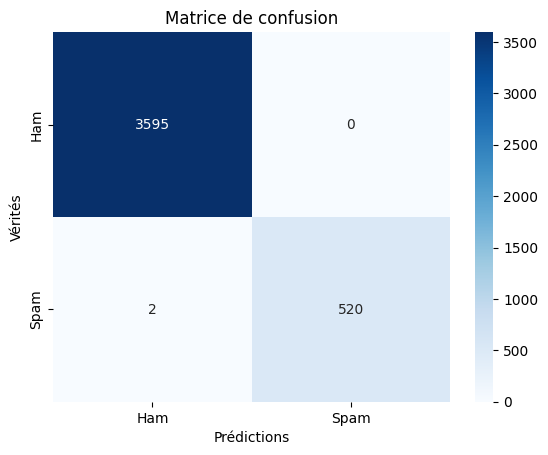

📌 Validation metrics:

🕒 Inference of 1030 messages took 0:00:00 (h:mm:ss) [avg: 0.0000s/msg]
✅ Évaluation du modèle :
Accuracy  : 99.13%
Precision : 99.19%
Recall    : 93.85%
F1-score  : 96.44%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       0.99      1.00      1.00       900
        Spam       0.99      0.94      0.96       130

    accuracy                           0.99      1030
   macro avg       0.99      0.97      0.98      1030
weighted avg       0.99      0.99      0.99      1030



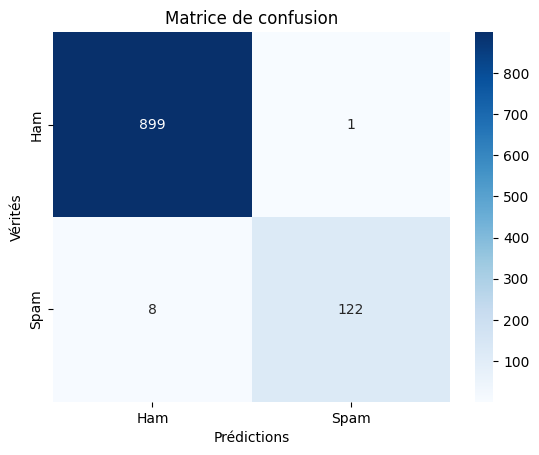

(0.001262099957528741,
 0.9912621359223301,
 0.991869918699187,
 0.9384615384615385,
 0.9644268774703557)

In [44]:
# Evaluate
print(f"{'='*40}\n📌 Train metrics:\n")
evaluate_pytorch_binary_model(embedding_model, X_train_tok_loader, criterion=embedding_criterion, device=device, plot=True)

print(f"{'='*40}\n📌 Validation metrics:\n")
evaluate_pytorch_binary_model(embedding_model, X_val_tok_loader, criterion=embedding_criterion, device=device, plot=True)

## Embeddings with GRU

In [45]:
class SpamClassifierWithGru(nn.Module):
    def __init__(self, vocab_size, embed_dim=128, hidden_dim=128, num_layers=2, bidirectional=True, dropout=0.3):
        super().__init__()
        
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=0)

        self.gru = nn.GRU(
            input_size=embed_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=bidirectional,
            dropout=dropout if num_layers > 1 else 0
        )

        self.dropout = nn.Dropout(dropout)
        
        gru_output_dim = hidden_dim * (2 if bidirectional else 1)
        
        self.fc = nn.Linear(gru_output_dim, 1)

    def forward(self, x, lengths=None):
        embedded = self.dropout(self.embedding(x))  # [batch_size, seq_len, emb_dim]

        if lengths is not None:
            packed = nn.utils.rnn.pack_padded_sequence(embedded, lengths, batch_first=True, enforce_sorted=False)
            packed_output, hidden = self.gru(packed)
        else:
            output, hidden = self.gru(embedded)

        # Extract final hidden state
        if self.gru.bidirectional:
            # Concatenate the final hidden states from both directions
            hidden = torch.cat((hidden[-2], hidden[-1]), dim=1) # [batch_size, hidden_dim * 2]
        else:
            hidden = hidden[-1] # [batch_size, hidden_dim]

        out = self.fc(self.dropout(hidden))  # [batch_size, 1]
        return out.squeeze(1)  # [batch_size]


In [46]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

GRU_DROPOUT=0.3
GRU_NUM_LAYERS=4
GRU_HIDDEN_DIM=128

gru_model = SpamClassifierWithGru(
    vocab_size=tik_tokenizer.n_vocab,
    hidden_dim=GRU_HIDDEN_DIM,
    num_layers=GRU_NUM_LAYERS,
    bidirectional=True,
    dropout=GRU_DROPOUT
).to(device)

gru_criterion = nn.BCEWithLogitsLoss().to(device)

# gru_optimizer = torch.optim.Adam(gru_model.parameters(), lr=1e-5) # -> weird validation loss
gru_optimizer = AdamW(gru_model.parameters(), lr=1e-4, weight_decay=1e-4, eps=1e-8)

# # Train the model on 20 epochs
gru_history = train_binary_model(gru_model,
                train_loader=X_train_tok_loader,
                val_loader=X_val_tok_loader,
                criterion=gru_criterion,
                optimizer=gru_optimizer,
                epochs=12,
                device=device)

Epoch [1/12], Loss: 0.0120, Acc: 0.8737, Val Loss: 0.0080, Val Acc: 0.8981, 4117 samples
Epoch [2/12], Loss: 0.0056, Acc: 0.9356, Val Loss: 0.0036, Val Acc: 0.9641, 4117 samples
Epoch [3/12], Loss: 0.0036, Acc: 0.9631, Val Loss: 0.0029, Val Acc: 0.9738, 4117 samples
Epoch [4/12], Loss: 0.0029, Acc: 0.9718, Val Loss: 0.0028, Val Acc: 0.9796, 4117 samples
Epoch [5/12], Loss: 0.0024, Acc: 0.9762, Val Loss: 0.0026, Val Acc: 0.9796, 4117 samples
Epoch [6/12], Loss: 0.0021, Acc: 0.9806, Val Loss: 0.0022, Val Acc: 0.9796, 4117 samples
Epoch [7/12], Loss: 0.0019, Acc: 0.9813, Val Loss: 0.0022, Val Acc: 0.9825, 4117 samples
Epoch [8/12], Loss: 0.0017, Acc: 0.9840, Val Loss: 0.0020, Val Acc: 0.9835, 4117 samples
Epoch [9/12], Loss: 0.0016, Acc: 0.9852, Val Loss: 0.0019, Val Acc: 0.9845, 4117 samples
Epoch [10/12], Loss: 0.0015, Acc: 0.9862, Val Loss: 0.0022, Val Acc: 0.9825, 4117 samples
Epoch [11/12], Loss: 0.0012, Acc: 0.9903, Val Loss: 0.0019, Val Acc: 0.9845, 4117 samples
Epoch [12/12], Loss

In [47]:
print_torch_info(gru_model)

Parameters:  13923201 (Trainable: 13923201)


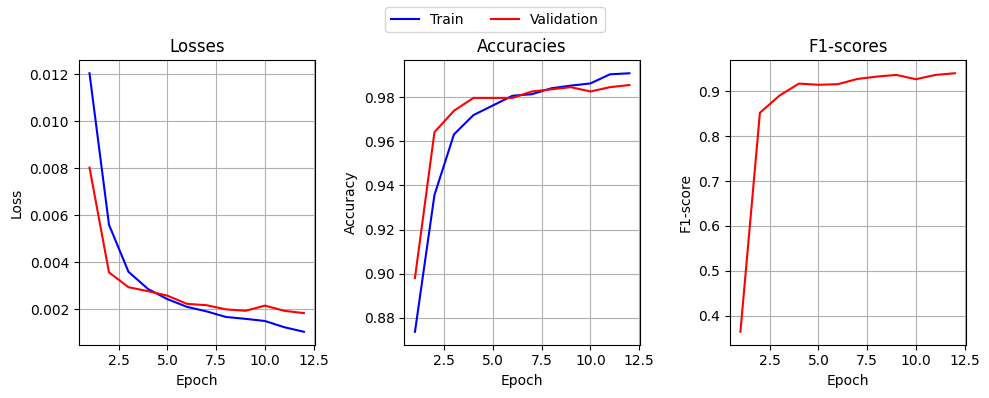

In [48]:
plot_train_history(gru_history)

📌 Train metrics:

🕒 Inference of 4117 messages took 0:00:01 (h:mm:ss) [avg: 0.0001s/msg]
✅ Évaluation du modèle :
Accuracy  : 99.51%
Precision : 99.41%
Recall    : 96.74%
F1-score  : 98.06%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       1.00      1.00      1.00      3595
        Spam       0.99      0.97      0.98       522

    accuracy                           1.00      4117
   macro avg       0.99      0.98      0.99      4117
weighted avg       1.00      1.00      1.00      4117



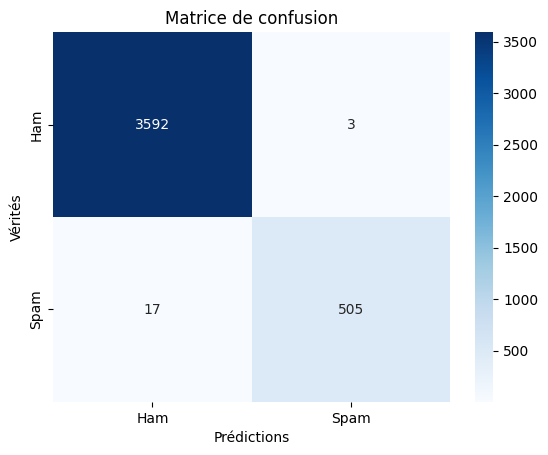

📌 Validation metrics:

🕒 Inference of 1030 messages took 0:00:00 (h:mm:ss) [avg: 0.0001s/msg]
✅ Évaluation du modèle :
Accuracy  : 98.54%
Precision : 96.75%
Recall    : 91.54%
F1-score  : 94.07%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       0.99      1.00      0.99       900
        Spam       0.97      0.92      0.94       130

    accuracy                           0.99      1030
   macro avg       0.98      0.96      0.97      1030
weighted avg       0.99      0.99      0.99      1030



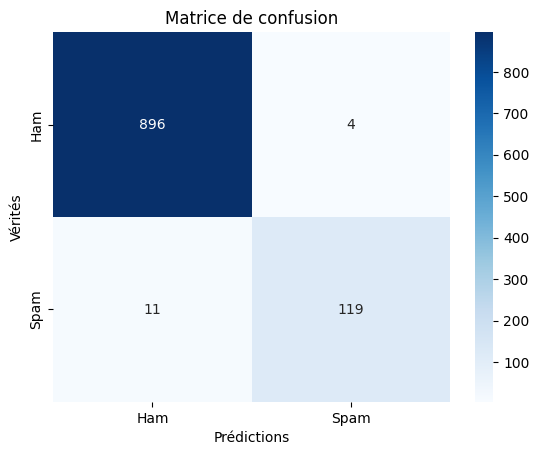

(0.001838139941558712,
 0.9854368932038835,
 0.967479674796748,
 0.9153846153846154,
 0.9407114624505929)

In [49]:
# Evaluate
print(f"{'='*40}\n📌 Train metrics:\n")
evaluate_pytorch_binary_model(gru_model, X_train_tok_loader, criterion=gru_criterion, device=device, plot=True)

print(f"{'='*40}\n📌 Validation metrics:\n")
evaluate_pytorch_binary_model(gru_model, X_val_tok_loader, criterion=gru_criterion, device=device, plot=True)

## Pre-trained model: BERT

In [50]:
class SpamBertDataset(Dataset):
    def __init__(self, texts, labels, bert_tokenizer):
        self.encodings = bert_tokenizer(texts, truncation=True, padding=True, return_tensors="pt")
        self.labels = torch.tensor(labels)

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        item = {key: val[idx] for key, val in self.encodings.items()}
        item["labels"] = self.labels[idx]
        return item

In [51]:
# Bert Tokenizer
bert_tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

# The data (raw message as tokenizer handles everything)
X_train_bert, X_val_bert, y_train_bert, y_val_bert = build_dataset_lists("message")

X_train_bert = SpamBertDataset(X_train_bert, y_train_bert, bert_tokenizer)
X_val_bert = SpamBertDataset(X_val_bert, y_val_bert, bert_tokenizer)

X_train_bert_loader = DataLoader(X_train_bert, batch_size=32, shuffle=True)
X_val_bert_loader = DataLoader(X_val_bert, batch_size=32)


In [87]:
# This function is used to train a PyTorch BERT model with training and validation datasets
def train_bert_model(model, train_loader, val_loader, optimizer, scheduler, epochs=10, device='cpu', base_folder="./assets/models/bert", save=False):
    history = {
        "train_loss": [],
        "val_loss": [],
        "train_accuracy": [],
        "val_accuracy": [],
        "train_prec": [],
        "val_prec": [],
        "train_rec": [],
        "val_rec": [],
        "train_f1": [],
        "val_f1": [],
    }
    
    best_val_f1 = 0.0
    
    # Measure the total training time for the whole run.
    total_t0 = time.time()
    
    if save:
        bert_model_folder_path = create_model_save_folder(base_folder)
    else:
        bert_model_folder_path = None

    for epoch_i in range(epochs):
        total_train_loss = 0
        train_preds = []
        train_labels = []
        
        print("")
        print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
        print('Training...')

        # Measure how long the training epoch takes.
        t0 = time.time()

        # Training loop
        model.train()

        for step, batch in enumerate(train_loader):
            
            # Progress update every 40 batches.
            if step % 40 == 0 and not step == 0:
                # Calculate elapsed time in minutes.
                elapsed = format_time(time.time() - t0)

                # Report progress.
                print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(train_loader), elapsed))

            # batch['input_ids', 'token_type_ids', 'attention_mask', 'labels']
            batch = {k: v.to(device) for k, v in batch.items()}

            model.zero_grad()
            
            outputs = model(**batch)
            loss = outputs.loss
            logits = outputs.logits

            # Accumulate the training loss over all of the batches so that we can
            # calculate the average loss at the end. `loss` is a Tensor containing a
            # single value; the `.item()` function just returns the Python value from the tensor.
            total_train_loss += loss.item()

            # Perform a backward pass to calculate the gradients.
            loss.backward()
            
            # Clip the norm of the gradients to 1.0.
            # This is to help prevent the "exploding gradients" problem.
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

            # Update parameters and take a step using the computed gradient.
            optimizer.step()
            
            # Update the learning rate.
            scheduler.step()
            
            # Compter les prédictions correctes
            preds = torch.argmax(logits, dim=1)

            train_preds.extend(preds.cpu().numpy())
            train_labels.extend(batch["labels"].cpu().numpy())
            
            del loss
            del logits
            del outputs

        print()
        print("  train_preds  :", np.unique(train_preds, return_counts=True))
        print("  train_labels :", np.unique(train_labels, return_counts=True))

        # Compute average loss and accuracy for training
        train_loss = total_train_loss / len(train_loader.dataset)
        train_acc, train_prec, train_rec, train_f1 = evaluate_model(train_labels, train_preds, plot=False)

        # Measure how long this epoch took.
        training_time = format_time(time.time() - t0)

        print("")
        print("  Average training loss: {0:.2f}".format(train_loss))
        print("  Training epoch took: {:}".format(training_time))
        
        # ========================================
        #               Validation
        # ========================================
        # After the completion of each training epoch, measure our performance on our validation set.
        print("")
        print("Running Validation...")

        t0 = time.time()

        # Validation starts
        model.eval()
        total_val_loss = 0
        val_preds = []
        val_labels = []
        for batch_val in val_loader:
            batch_val = {k: v.to(device) for k, v in batch_val.items()}
            
            # We don't need gradients for testing
            with torch.no_grad():
                outputs = model(**batch_val)

            loss = outputs.loss
            logits = outputs.logits
            
            # Calculating total batch loss using the logits and labels
            # outputs.loss available as labels is passed to model
            total_val_loss += loss.item()
            
            # Compter les prédictions correctes
            preds = torch.argmax(logits, dim=1)
            
            # Move logits and labels to CPU
            # logits = logits.detach().cpu().numpy()
            # label_ids = b_labels.to('cpu').numpy()

            val_preds.extend(preds.cpu().numpy())
            val_labels.extend(batch_val["labels"].cpu().numpy())
            
            del loss
            del logits
            del outputs
        
        print()
        print("  val_preds  :", np.unique(val_preds, return_counts=True))
        print("  val_labels :", np.unique(val_labels, return_counts=True))

        # Compute average loss and accuracy for training
        val_loss = total_val_loss / len(val_loader.dataset)
        
        # Validation ends
        
        val_acc, val_prec, val_rec, val_f1 = evaluate_model(val_labels, val_preds, plot=False)
        
        # Measure how long the validation run took.
        validation_time = format_time(time.time() - t0)

        print("  Accuracy: {0:.2f}".format(val_acc))
        print("  Validation Loss: {0:.2f}".format(val_loss))
        print("  Validation took: {:}".format(validation_time))
        
        if save & (val_f1 > best_val_f1):
            best_val_f1 = val_f1

            # Sauvegarder le modèle (sauver le tokenizer au même endroit)
            model.save_pretrained(bert_model_folder_path)

            print(f"📦 Epoch [{epoch_i + 1}/{epochs}] - Nouveau meilleur modèle sauvegardé (F1 = {val_f1:.4f})")

        # Store metrics in history dictionary
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)

        history["train_accuracy"].append(train_acc)
        history["val_accuracy"].append(val_acc)

        history["train_prec"].append(train_prec)
        history["val_prec"].append(val_prec)
        
        history["train_rec"].append(train_rec)
        history["val_rec"].append(val_rec)

        history["train_f1"].append(train_f1)
        history["val_f1"].append(val_f1)
        
        # print(f"Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.4f}, Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

    print("")
    print("Training complete!")

    print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))

    return bert_model_folder_path, history  # Return training history

In [64]:
def print_bert_model(model):
    # Get all of the model's parameters as a list of tuples.
    params = list(model.named_parameters())

    print('The BERT model has {:} different named parameters.\n'.format(len(params)))

    print('==== Embedding Layer ====\n')

    for p in params[0:5]:
        print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

    print('\n==== First Transformer ====\n')

    for p in params[5:21]:
        print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

    print('\n==== Output Layer ====\n')

    for p in params[-4:]:
        print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))
    
def set_trainable_layers(model, count_from_end):
    # Let freeze all layers but classifier
    params = list(model.named_parameters())
    
    if count_from_end == -1:
        for p in params:
            p[1].requires_grad = True
    else:
        for p in params[:-count_from_end]:
            p[1].requires_grad = False

        for p in params[-count_from_end:]:
            p[1].requires_grad = True


In [90]:
# Modèle BERT
bert_model = BertForSequenceClassification.from_pretrained(
    "bert-base-uncased",
    num_labels=2,
    output_attentions = False,
    output_hidden_states = False,
)

bert_model

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [ ]:
def run_train(train_model, device):
    # Optimiseur
    optimizer = AdamW(train_model.parameters(), lr=2e-5, eps = 1e-8)

    # Number of training epochs. The BERT authors recommend between 2 and 4. 
    # We chose to run for 4, but we'll see later that this may be over-fitting the
    # training data.
    epochs = 4

    # Total number of training steps is [number of batches] x [number of epochs]. 
    # (Note that this is not the same as the number of training samples).
    total_steps = len(X_train_bert_loader) * epochs

    # Create the learning rate scheduler.
    scheduler = get_linear_schedule_with_warmup(optimizer, 
                                                num_warmup_steps = 0, # Default value in run_glue.py
                                                num_training_steps = total_steps)

    # Entraînement simple
    train_model.to(device)

    # Train the model
    best_model_folder, bert_history = train_bert_model(train_model,
                    train_loader=X_train_bert_loader,
                    val_loader=X_val_bert_loader,
                    optimizer=optimizer,
                    scheduler=scheduler,
                    epochs=epochs,
                    device=device)

    # Save the tokenizer with best model
    # bert_tokenizer.save_pretrained(best_model_folder)
    
    return bert_history

# Reload
# bert_model = BertForSequenceClassification.from_pretrained(bert_model_path)
# bert_tokenizer = BertTokenizer.from_pretrained(bert_model_path)

### Train few layers

In [91]:
# Modèle BERT
set_trainable_layers(bert_model, 8)
print_torch_info(bert_model)

Parameters:  109483778 (Trainable: 2953730)


In [92]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

bert_8_layers_history = run_train(bert_model, device)


======== Epoch 1 / 4 ========
Training...
  Batch    40  of    129.    Elapsed: 0:00:10.
  Batch    80  of    129.    Elapsed: 0:00:18.
  Batch   120  of    129.    Elapsed: 0:00:26.

  train_preds  : (array([0, 1]), array([4066,   51]))
  train_labels : (array([0, 1]), array([3595,  522]))

  Average training loss: 0.01
  Training epoch took: 0:00:28

Running Validation...

  val_preds  : (array([0, 1]), array([941,  89]))
  val_labels : (array([0, 1]), array([900, 130]))
  Accuracy: 0.96
  Validation Loss: 0.00
  Validation took: 0:00:03

======== Epoch 2 / 4 ========
Training...
  Batch    40  of    129.    Elapsed: 0:00:10.
  Batch    80  of    129.    Elapsed: 0:00:20.
  Batch   120  of    129.    Elapsed: 0:00:30.

  train_preds  : (array([0, 1]), array([3718,  399]))
  train_labels : (array([0, 1]), array([3595,  522]))

  Average training loss: 0.00
  Training epoch took: 0:00:32

Running Validation...

  val_preds  : (array([0, 1]), array([913, 117]))
  val_labels : (array([0

TypeError: stat: path should be string, bytes, os.PathLike or integer, not NoneType

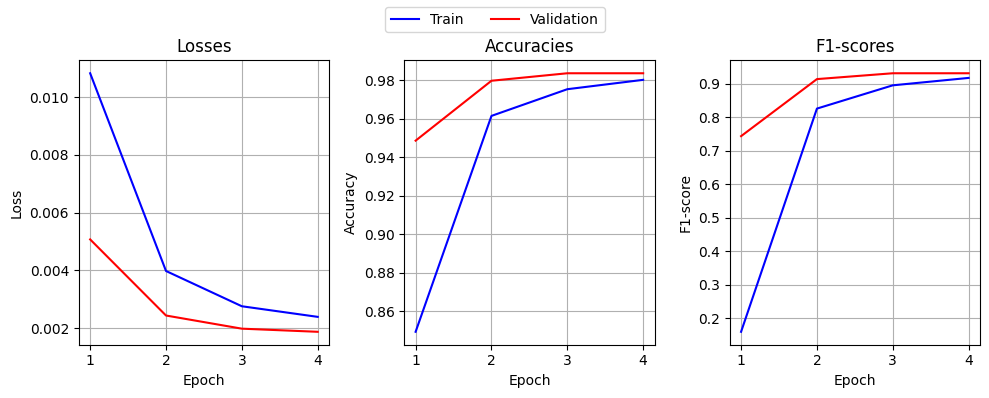

In [69]:
plot_train_history(bert_8_layers_history)

In [71]:
def evaluate_bert_model(model, dataloader, device='cpu', plot=False):
    model.eval()
    y_true = []
    y_pred = []
    
    predictions = []
    true_labels = []

    total_t0 = time.time()

    with torch.no_grad():
        for batch in dataloader:
            batch = {k: v.to(device) for k, v in batch.items()}

            outputs = model(**batch)

            preds = torch.argmax(outputs.logits, dim=1)

            y_true.extend(batch["labels"].cpu().numpy())
            y_pred.extend(preds.cpu().numpy())
            
            # Move logits and labels to CPU
            logits = outputs['logits'].detach().cpu().numpy()
            label_ids = batch["labels"].cpu().numpy()
            
            # Store predictions and true labels
            predictions.append(logits)
            true_labels.append(label_ids)
            
            del outputs

    total_samples = len(dataloader.dataset)
    
    d_t = time.time()-total_t0
    print("🕒 Inference of {} messages took {:} (h:mm:ss) [avg: {:.4f}s/msg]".format(total_samples, format_time(d_t), d_t / total_samples))
    
    # plot reports if requested
    acc, prec, rec, f1 = evaluate_model(y_true, y_pred, plot)
    return acc, prec, rec, f1

📌 Train metrics:



🕒 Inference of 4117 messages took 0:00:30 (h:mm:ss) [avg: 0.0074s/msg]
✅ Évaluation du modèle :
Accuracy  : 98.30%
Precision : 95.38%
Recall    : 91.00%
F1-score  : 93.14%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       0.99      0.99      0.99      3595
        Spam       0.95      0.91      0.93       522

    accuracy                           0.98      4117
   macro avg       0.97      0.95      0.96      4117
weighted avg       0.98      0.98      0.98      4117



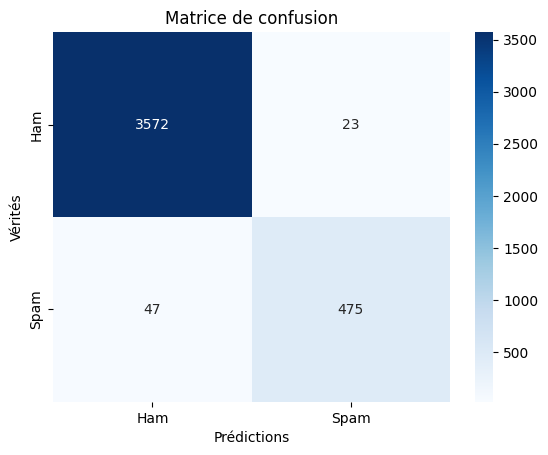

📌 Validation metrics:

🕒 Inference of 1030 messages took 0:00:04 (h:mm:ss) [avg: 0.0040s/msg]
✅ Évaluation du modèle :
Accuracy  : 98.35%
Precision : 97.48%
Recall    : 89.23%
F1-score  : 93.17%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       0.98      1.00      0.99       900
        Spam       0.97      0.89      0.93       130

    accuracy                           0.98      1030
   macro avg       0.98      0.94      0.96      1030
weighted avg       0.98      0.98      0.98      1030



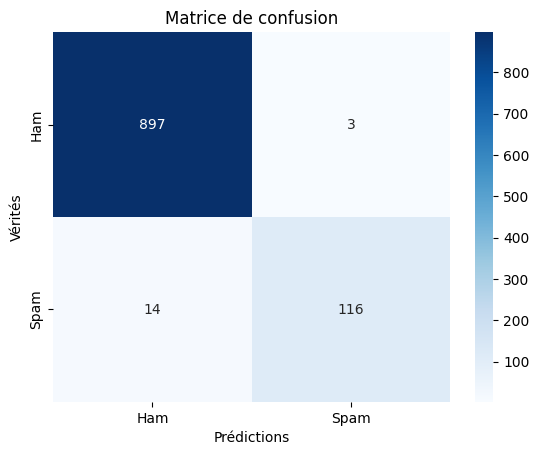

(0.983495145631068, 0.9747899159663865, 0.8923076923076924, 0.9317269076305221)

In [72]:
print(f"{'='*40}\n📌 Train metrics:\n")
evaluate_bert_model(bert_model, X_train_bert_loader, device=device, plot=True)

print(f"{'='*40}\n📌 Validation metrics:\n")
evaluate_bert_model(bert_model, X_val_bert_loader, device=device, plot=True)

### Train ALL

In [73]:
# Modèle BERT
bert_model_all = BertForSequenceClassification.from_pretrained(
    "bert-base-uncased",
    num_labels=2,
    output_attentions = False,
    output_hidden_states = False,
)

bert_model_all

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [74]:
print_torch_info(bert_model_all)


Parameters:  109483778 (Trainable: 109483778)


In [75]:
# Modèle BERT
set_trainable_layers(bert_model_all, -1)
print_torch_info(bert_model_all)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

bert_all_layers_history = run_train(bert_model_all, device)

Parameters:  109483778 (Trainable: 109483778)

======== Epoch 1 / 4 ========
Training...


  Batch    40  of    129.    Elapsed: 0:01:22.
  Batch    80  of    129.    Elapsed: 0:02:30.
  Batch   120  of    129.    Elapsed: 0:03:38.

  train_preds  : (array([0, 1]), array([3656,  461]))
  train_labels : (array([0, 1]), array([3595,  522]))

  Average training loss: 0.00
  Training epoch took: 0:03:52

Running Validation...

  val_preds  : (array([0, 1]), array([900, 130]))
  val_labels : (array([0, 1]), array([900, 130]))
  Accuracy: 0.99
  Validation Loss: 0.00
  Validation took: 0:00:07
📦 Epoch [1/4] - Nouveau meilleur modèle sauvegardé (F1 = 0.9538)

======== Epoch 2 / 4 ========
Training...
  Batch    40  of    129.    Elapsed: 0:01:14.
  Batch    80  of    129.    Elapsed: 0:03:12.
  Batch   120  of    129.    Elapsed: 0:06:17.

  train_preds  : (array([0, 1]), array([3605,  512]))
  train_labels : (array([0, 1]), array([3595,  522]))

  Average training loss: 0.00
  Training epoch took: 0:06:51

Running Validation...

  val_preds  : (array([0, 1]), array([906, 124]))
  

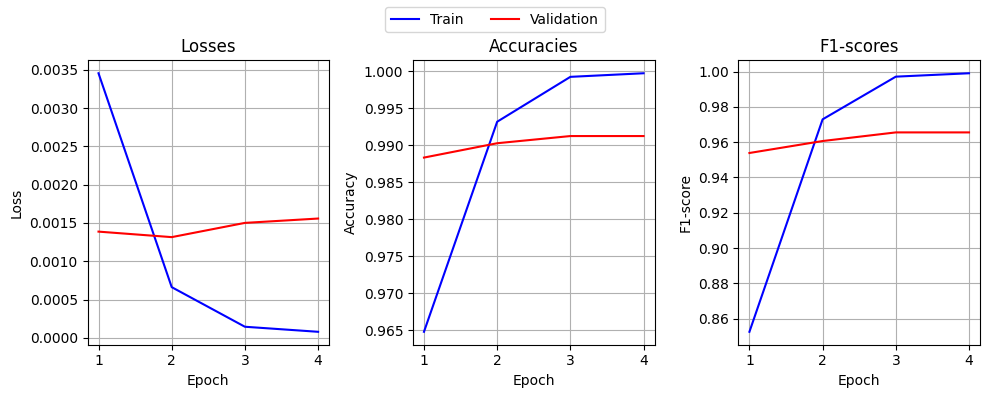

In [76]:
plot_train_history(bert_all_layers_history)

📌 Train metrics:

🕒 Inference of 4117 messages took 0:00:50 (h:mm:ss) [avg: 0.0120s/msg]
✅ Évaluation du modèle :
Accuracy  : 99.98%
Precision : 100.00%
Recall    : 99.81%
F1-score  : 99.90%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       1.00      1.00      1.00      3595
        Spam       1.00      1.00      1.00       522

    accuracy                           1.00      4117
   macro avg       1.00      1.00      1.00      4117
weighted avg       1.00      1.00      1.00      4117



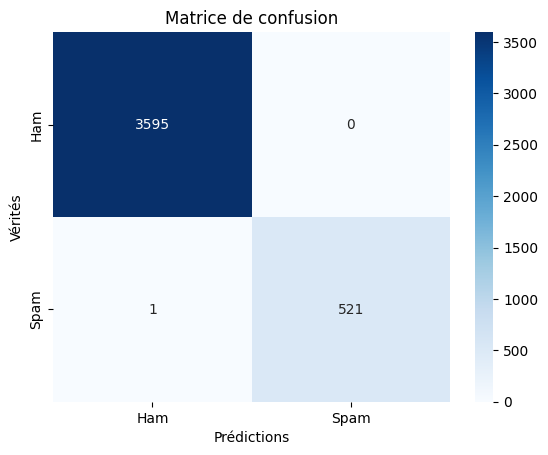

📌 Validation metrics:

🕒 Inference of 1030 messages took 0:00:07 (h:mm:ss) [avg: 0.0064s/msg]
✅ Évaluation du modèle :
Accuracy  : 99.13%
Precision : 96.18%
Recall    : 96.92%
F1-score  : 96.55%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       1.00      0.99      0.99       900
        Spam       0.96      0.97      0.97       130

    accuracy                           0.99      1030
   macro avg       0.98      0.98      0.98      1030
weighted avg       0.99      0.99      0.99      1030



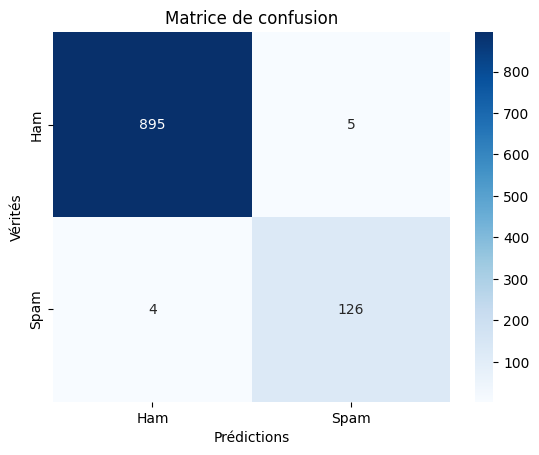

(0.9912621359223301,
 0.9618320610687023,
 0.9692307692307692,
 0.9655172413793104)

In [77]:
print(f"{'='*40}\n📌 Train metrics:\n")
evaluate_bert_model(bert_model_all, X_train_bert_loader, device=device, plot=True)

print(f"{'='*40}\n📌 Validation metrics:\n")
evaluate_bert_model(bert_model_all, X_val_bert_loader, device=device, plot=True)

### Synthèse

BERT 8 layers

| metric | train | validation |
| - | - | - |
Accuracy  | 98.20% | 98.54%
Precision | 95.90% | 97.52%
Recall    | 89.66% | 90.77%
F1-score  | 92.67% | 94.02%

BERT all layers

| metric | train | validation |
| - | - | - |
Accuracy  | 99.98% | 99.22%
Precision | 100.00% | 97.52%
Recall    | 99.81% | 96.15%
F1-score  | 99.90% | 96.90%

Surement un epoch en trop sur le "all layers".
Mais on constate bien que l'entrainement total apporte un gain certain.

Neanmoins, ce modèle est trop exigeant en terme de ressources.

## Finetuned Spam Detection Model: mrm8488/bert-tiny-finetuned-sms-spam-detection

Le modèle [`mrm8488/bert-tiny-finetuned-sms-spam-detection`](https://huggingface.co/mrm8488/bert-tiny-finetuned-sms-spam-detection) publié sur HuggingFace est spécifiquement fine-tuned pour la détection de spam SMS.

C'est aussi un modèle plus lègé (BERT-tiny=4.4M paramètres vs BERT-base=110M paramètres) ce qui devrait le rendre plus rapide.

config.json:   0%|          | 0.00/645 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/17.6M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/324 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Device set to use cuda:0


📌 Train metrics:

🕒 Inference of 4117 messages took 0:00:13 (h:mm:ss) [avg: 0.0031s/msg]
✅ Évaluation du modèle :
Accuracy  : 98.37%
Precision : 97.10%
Recall    : 89.85%
F1-score  : 93.33%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       0.99      1.00      0.99      3595
        Spam       0.97      0.90      0.93       522

    accuracy                           0.98      4117
   macro avg       0.98      0.95      0.96      4117
weighted avg       0.98      0.98      0.98      4117



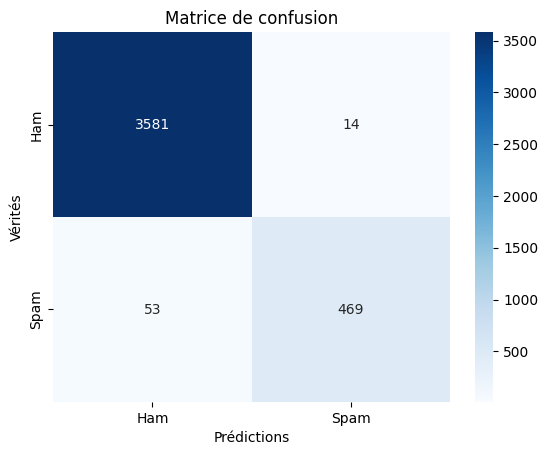

📌 Validation metrics:

🕒 Inference of 1030 messages took 0:00:03 (h:mm:ss) [avg: 0.0030s/msg]
✅ Évaluation du modèle :
Accuracy  : 98.64%
Precision : 98.33%
Recall    : 90.77%
F1-score  : 94.40%

📋 Classification Report :
               precision    recall  f1-score   support

         Ham       0.99      1.00      0.99       900
        Spam       0.98      0.91      0.94       130

    accuracy                           0.99      1030
   macro avg       0.99      0.95      0.97      1030
weighted avg       0.99      0.99      0.99      1030



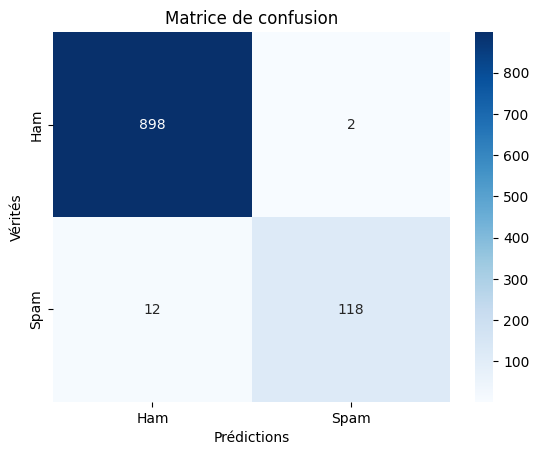

(0.9864077669902913, 0.9833333333333333, 0.9076923076923077, 0.944)

In [78]:
classifier = pipeline("text-classification", model="mrm8488/bert-tiny-finetuned-sms-spam-detection")

# As the model is pre-trained, just run inference!
X_train_mrm8488, X_val_mrm8488, y_train_mrm8488, y_val_mrm8488 = build_dataset_lists("message")

t_train_pred_0 = time.time()
train_pred_mrm8488 = classifier(X_train_mrm8488)
d_train_pred = time.time() - t_train_pred_0

t_val_pred_0 = time.time()
val_pred_mrm8488 = classifier(X_val_mrm8488)
d_val_pred = time.time() - t_val_pred_0

# Prepare data and evaluate metrics
train_pred_mrm8488_df = pd.DataFrame(train_pred_mrm8488)
val_pred_mrm8488_df = pd.DataFrame(val_pred_mrm8488)

# Convert string labels to int(0|1) 
train_pred_mrm8488_df["label"] = train_pred_mrm8488_df["label"].apply(lambda x : int(x.split("_")[1]))
val_pred_mrm8488_df["label"] = val_pred_mrm8488_df["label"].apply(lambda x : int(x.split("_")[1]))

train_pred_mrm8488 = train_pred_mrm8488_df["label"].tolist()
val_pred_mrm8488 = val_pred_mrm8488_df["label"].tolist()

# Show metrics
print(f"{'='*40}\n📌 Train metrics:\n")
print("🕒 Inference of {} messages took {:} (h:mm:ss) [avg: {:.4f}s/msg]".format(len(X_train_mrm8488), format_time(d_train_pred), d_train_pred / len(X_train_mrm8488)))

evaluate_model(y_train_mrm8488, train_pred_mrm8488, plot=True)

print(f"{'='*40}\n📌 Validation metrics:\n")
print("🕒 Inference of {} messages took {:} (h:mm:ss) [avg: {:.4f}s/msg]".format(len(X_val_mrm8488), format_time(d_val_pred), d_val_pred / len(X_val_mrm8488)))

evaluate_model(y_val_mrm8488, val_pred_mrm8488, plot=True)

## CUDA cleanups

In [79]:
def memory_stats():
    print(torch.cuda.memory_allocated()/1024**2)
    print(torch.cuda.memory_reserved()/1024**2)

In [94]:
import gc
memory_stats()

torch.cuda.empty_cache()
gc.collect()

memory_stats()

2625.37060546875
2768.0
2625.37060546875
2768.0
2625.37060546875
2768.0
